<a href="https://colab.research.google.com/github/Weverton-Vitor/qualifact-course/blob/main/experiment_75.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

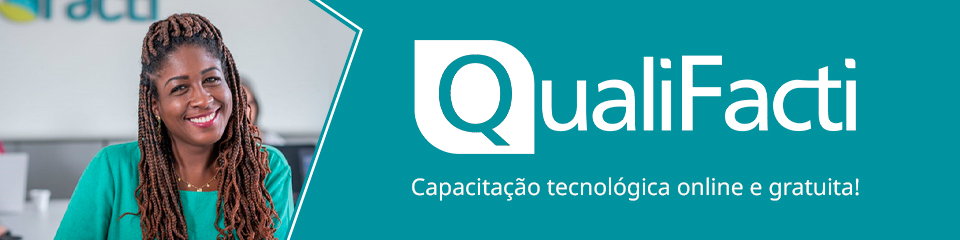

# **Inteligência Artificial aplicada à Visão Computacional**

**Capítulo 9: Visão Computacional aplicada ao reconhecimento e sintetização de voz**



<p align="justify">

Todos os direitos reservados à Facti, 2024
<p>

[www.qualifacti.com.br](https://)

---

<p align="justify">
É importante esclarecer que estas atividades não compõem a avaliação e não haverá correção formal por parte dos instrutores; o objetivo é a autoaprendizagem e prática.
<p>

---

# **ETAPA CONCEITUALIZAR**

---

# **Recado importante**


Olá,
<p align="justify">
Como parte do capítulo de <b>reconhecimento e sintetização de voz</b>, gostaríamos de ressaltar a importância de realizar as atividades de implementação fornecidas. Estas atividades são cuidadosamente desenhadas para reforçar o conteúdo apresentado.
Lembre-se, a implementação é uma habilidade que se aprimora com a prática. Ao aplicar os conceitos aprendidos, especialmente por meio da escrita e execução de códigos, você ganhará uma compreensão mais profunda e prática dos modelos.
Encorajamos todos a dedicar tempo a essas atividades. Ao fazer isso, você não apenas reforçará o que foi ensinado, mas também desenvolverá as habilidades essenciais de resolução de problemas e depuração de código.

Lembrem-se: não basta apenas aprender, é preciso codificar! O caminho para dominar os modelos começa com a experiência prática.

Atenciosamente,

Júlio e Marcelo
<p>

---

# **Atividade de experimentação 75**

Transcrição on-line de áudio

Neste projeto será utilizada a biblioteca SpeechRecognition para fazer a transcrição on-line de áudios.

**on-line quer dizer que a API desta biblioteca que será utilizada no projeto, precisa estar conectada à Internet.**




## Instalando as bibliotecas

In [ ]:
# Instalação das bibliotecas SpeechRecognition e PyAudio
!pip install SpeechRecognition
!pip install PyAudio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for PyAudio (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for PyAudio
Failed to build PyAudio
ERROR: Could not build wheels for PyAudio, which is required to install pyproject.toml-based projects


## Importando as bibliotecas

In [ ]:
# Importação das bibliotecas necessárias
import speech_recognition as sr
print('Versão Speech Recognition: ', sr.__version__)
import librosa
import soundfile as sf
from IPython.display import Audio, Javascript
from google.colab import output
from io import BytesIO
from base64 import b64decode
import numpy as np

Versão Speech Recognition:  3.10.1


**Classe `Recognizer`**

O objetivo principal de uma instância `Recognizer` é, obviamente, reconhecer a fala. Cada instância vem com uma variedade de configurações e funcionalidades para reconhecer a fala de uma fonte de áudio.

Cada instância `Recognizer` tem sete métodos para reconhecer a fala de uma fonte de áudio usando várias APIs. Estes são:

* `recognize_bing()`: Microsoft Bing Speech
* `recognize_google()`: Google Web Speech API
* `recognize_google_cloud()`: Google Cloud Speech - requer a instalação do pacote google-cloud-speech
* `recognize_houndify()`: Houndify por SoundHound
* `recognize_ibm()`: IBM Speech to Text
* `recognize_sphinx()`: CMU Sphinx - requer a instalação do PocketSphinx
* `recognize_wit()`: Wit.ai

Dos sete, só `recognize_sphinx()` funciona off-line com o motor CMU Sphinx. Os outros seis exigem uma conexão com a Internet.

Como o SpeechRecognition é fornecido com uma chave de API padrão para a Google Web Speech API, por esse motivo optou-se por usá-lo. As outras seis APIs exigem autenticação com uma chave de API ou uma combinação de nome de usuário/senha. Para obter mais informações estão disponíveis neste link: [Speech Recognition Library Reference](https://github.com/Uberi/speech_recognition/blob/master/reference/library-reference.rst#speech-recognition-library-reference)



In [ ]:
# Inicialização do objeto Recognizer para reconhecimento de voz
r = sr.Recognizer()

**Classe `AudioFile`**

Essa classe pode ser inicializada com o caminho para um arquivo de áudio e fornece uma interface de gerenciador de contexto para ler e trabalhar com o conteúdo do arquivo.


**Tipos de arquivo suportados**

Atualmente, o SpeechRecognition suporta os seguintes formatos de arquivo:
* WAV;
* AIFF;
* AIFF-C;
* FLAC: deve ser formato FLAC nativo; OGG-FLAC não é suportado.

Se estiver trabalhando em Linux, macOS ou Windows baseado em arquiteturas x-86, poderá trabalhar com arquivos FLAC sem problemas. Em outras plataformas, precisará instalar um codificador FLAC e garantir que tenha acesso à ferramente flac de linha de comando.

## Testando a biblioteca

Como exemplo, será utilizado o áudiolivro **Astronomia Parte 1 - O Sistema Solar** que está disponível gratuitamente neste site: [Universidade Falada AUDIOLIVROS](https://www.universidadefalada.com.br/audiolivros-gratis-audio-livro-gratuito.html)

In [ ]:
# Montagem do Google Drive para acessar arquivos armazenados
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Realize o dowload da pasta Material_complementar_reconhecimento_voz.zip do Google Sala de Aula e transfira-a para o seu Google Drive
# Localize o caminho da pasta no menu Arquivos, no menu lateral esquerdo
import zipfile
path = "/content/gdrive/MyDrive/Material_complementar_reconhecimento_voz.zip"
zip_object = zipfile.ZipFile(file=path, mode="r")
zip_object.extractall("./")

In [ ]:
# Carregamento do arquivo de áudio e reprodução
audio_source = '/content/audios/O sistema solar.wav'
data, sample_rate = librosa.load(audio_source, sr = None)
Audio(data, rate = sample_rate)

In [ ]:
# Gravação do áudio de volta para um arquivo
sf.write('/content/audios/O sistema solar.wav', data, sample_rate)

In [ ]:
# Leitura do arquivo de áudio para reconhecimento de voz
audio = sr.AudioFile(audio_source)
with audio as source:
  texto = r.record(source)

In [ ]:
# Reconhecimento de voz usando Google Web Speech API com idioma português
# Idiomas suportados: https://cloud.google.com/speech-to-text/docs/languages
r.recognize_google(texto, language='pt-BR')

'nesta breve aula vamos introduzir a visão que temos atualmente do nosso sistema solar partiremos de nossa estrela Central o sol e comentaremos brevemente as principais características dos corpos que se movimentam ao seu redor os planetas clássicos anões os asteroides e os cometas apertem Então os cintos pois nossa viagem pelo Cosmos já vai começar o sistema solar é formado por uma estrela Central que denominamos o sol e de tudo aquilo que se move ao redor dele como os oito planetas clássicos os planetas anões que atualmente são três a infinidade de asteroides cometas e material gasoso ainda que este último e menor quantidade e também poeira uma porcentagem destes dois últimos pode até mesmo ser remanescente da formação de nosso sistema nossa estrela Central O Sol é o maior corpo do Sistema Solar sendo que a distância de um lado ou outro grandeza que denominamos o diâmetro é equivalente a mais de 109 vezes a distância de um lado ou outro do planeta terra é no sol que está concentrada m

## Melhorando o resultado

In [ ]:
# Melhoria do reconhecimento de voz ajustando para ruído ambiente
audio_source = '/content/audios/Microfone.wav'
data, sample_rate = librosa.load(audio_source, sr = None)
Audio(data, rate = sample_rate)

In [ ]:
# Leitura do arquivo de áudio para reconhecimento de voz
audio = sr.AudioFile(audio_source)
with audio as source:
  r.adjust_for_ambient_noise(source, duration = 0.7)
  texto = r.record(source)
r.recognize_google(texto, language = 'pt-BR')

'existem muito mais atividades e oportunidades no mundo do que tempo e recursos para investir nelas'

 Trecho do livro **Essencialismo, Greg McKeown**.

> *Existem muito mais atividades e oportunidades no mundo do que recursos e tempo para investir nelas.*

## Utilizando o microfone

- Caso esteja executando este projeto na sua própria máquina, segue o link com mais detalhes sobre como a classe `Microphone` funciona: [Working With Microphones](https://realpython.com/python-speech-recognition/#working-with-microphones)

In [ ]:
# Código JavaScript para gravação de áudio através do microfone

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""
# Função record recebe como parâmetro a duração em segundos da gravação
def record(sec=10):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])

  with open('audio.wav','wb') as f:
    f.write(b)

  return 'audio.wav'

In [ ]:
# Iniciar uma gravação de áudio de 10 segundos
record(sec = 10)

<IPython.core.display.Javascript object>

'audio.wav'

In [ ]:
# Carregar e reproduzir o áudio gravado
audio_source = '/content/audio.wav'
data, sample_rate = librosa.load(audio_source, sr = None)
Audio(data = data, rate = sample_rate)

<ipython-input-14-7542d1d45bad>:2: UserWarning: PySoundFile failed. Trying audioread instead.
  data, sample_rate = librosa.load(audio_source, sr = None)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


In [ ]:
# Gravar o áudio para um arquivo e prepará-lo para reconhecimento de voz
audio_source = '/content/audio.wav'
sf.write(audio_source, data, sample_rate)
audio = sr.AudioFile(audio_source)
with audio as source:
  r.adjust_for_ambient_noise(source, duration=0.1)
  texto = r.record(source)

In [ ]:
# Tentativa de reconhecer o texto falado no áudio gravado
try:
  print(r.recognize_google(texto, language='pt-BR'))
except sr.UnknownValueError:
  print('Não foi possível fazer a transcrição!')

## Transcrevendo áudios do WhatsApp

**Instalar a biblioteca `pydub`**

In [ ]:
# Instalação da biblioteca pydub para manipulação de áudio
!pip install pydub

**Importar as bibliotecas**

In [ ]:
# Importação da biblioteca pydub e outras bibliotecas úteis
from pydub import AudioSegment
import os
import sys

**Carregar todos os arquivos deste diretório que estão no formato .ogg**

In [ ]:
# Carregamento de arquivos de áudio no formato OGG
oggs = []
path = os.path.dirname("/content/audios/")
abspath = os.path.abspath(path)
dirs = os.listdir(abspath)

In [ ]:
path

'/content/audios'

In [ ]:
abspath

'/content/audios'

In [ ]:
# Mostra os áudios da pasta do diretório
dirs

['latidos.wav',
 'gun_shot.wav',
 'Microfone.wav',
 'dog.wav',
 'O sistema solar.wav',
 'streetmusic.wav',
 'car_horn.wav',
 'children_playing.wav',
 'triste.wav',
 'surpreso.wav',
 'masculino.wav',
 'WhatsApp Ptt 2022-06-15 at 09.56.33.ogg',
 'dog_bark.wav',
 'O sistema solar.mp3']

In [ ]:
# Identifica qual o arquivo no formato ogg
for file in dirs:
  #print(file)
  if file.endswith('ogg'):
    oggs.append(file)
print(oggs)

['WhatsApp Ptt 2022-06-15 at 09.56.33.ogg']


In [ ]:
# Função para converter arquivos OGG para WAV
def ogg_to_wav(name):
  song = AudioSegment.from_ogg(abspath + '/' + name)
  export_name = os.path.splitext(name)[0]
  #print(song)
  #print(export_name)
  new_audio = song.export(export_name + '.wav', format = 'wav')
  return new_audio

In [ ]:
# Carregamento e reprodução de um arquivo de áudio OGG
audio_source = '/content/audios/WhatsApp Ptt 2022-06-15 at 09.56.33.ogg'
data, sample_rate = librosa.load(audio_source, sr = None)
Audio(data, rate = sample_rate)

In [ ]:
# Conversão dos arquivos OGG para WAV e reconhecimento de voz
r = sr.Recognizer()
for ogg in oggs:
  #print(ogg)
  new_audio = ogg_to_wav(ogg)
  audio = sr.AudioFile(new_audio)
  with audio as source:
    texto = r.record(source)
  print(r.recognize_google(texto, language = 'pt-BR'))

isto é um teste de transcrição de áudios do WhatsApp


**Carregar todos os arquivos deste diretório que estão no formato .opus**

In [ ]:
import subprocess
import os

# Função para converter arquivos Opus para WAV usando FFmpeg
def opus_to_wav(name):
    input_path = os.path.join(abspath, name)
    export_name = os.path.splitext(name)[0] + '.wav'
    output_path = os.path.join(abspath, export_name)

    # Comando FFmpeg para conversão
    command = ['ffmpeg', '-i', input_path, output_path]
    subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)

    return output_path

In [ ]:
# Percorrendo os arquivos Opus e convertendo para WAV
opuss = []
path = os.path.dirname('/content/audios/')
abspath = os.path.abspath(path)
dirs = os.listdir(abspath)
for file in dirs:
    if file.endswith('opus'):
        opuss.append(file)

In [ ]:
# Carregamento e reprodução de um arquivo de áudio OGG
audio_source = '/content/audios/Áudio do WhatsApp de 2023-08-21 à(s) 14.34.43.waptt (1).opus'
data, sample_rate = librosa.load(audio_source, sr = None)
Audio(data, rate = sample_rate)

In [ ]:
# Conversão e reconhecimento de voz
r = sr.Recognizer()
for opus in opuss:
    new_audio = opus_to_wav(opus)
    audio = sr.AudioFile(new_audio)
    with audio as source:
        texto = r.record(source)
    print(r.recognize_google(texto, language = 'pt-BR'))

eu digo que não é bom não porque não é gostoso é que é perigoso
